# Исследование рынка общественного питания Москвы

Инвесторы из фонда "Shut Up and Take My Money" планируют открыть заведение в сфере общественного питания в Москве. Заказчик не знает, какого рода будет данное заведение (кафе, ресторан или т.д.). Также неизвестно расположение, меню и ценообразование будущего заведения.

Необходимо провести исследование рынка Москвы, найти особенности и презентовать полученные результаты, которые могут помочь в выборе подходящего инвесторам места.

Предоставлен датасет с заведениями общественного питания Москвы, составленные на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация из сервиса Яндекс Бизнес может быть добавлена пользователями или найдена в общедоступных источниках, из-за чего она носит справочный характер.

In [1]:
#библиотеки
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import plotly
import plotly.express as px
from folium import Map, Choropleth
from folium import Map, Marker
from folium.plugins import MarkerCluster

## Изучение данных

In [2]:
#датасет заведений общественного питания
places = pd.read_csv('/datasets/moscow_places.csv')

In [3]:
def information(dataset):
    display(dataset.head())
    print('*'*50)
    dataset.info()
    print('*'*50)
    display(dataset.describe(percentiles=[0.05, 0.1, 1/4, 0.33, 0.4, 1/2, 0.6, 3/4, 0.9, 0.95, 0.99]).T)
    print('*'*50)
    print('Количество явных дубликатов:', dataset.duplicated().sum())
    print('*'*50)
    dataset.hist(bins = 30, figsize = (20, 10))
    plt.show()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


**************************************************
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB
**********

,count,mean,std,min,5%,10%,25%,33%,40%,50%,60%,75%,90%,95%,99%,max
lat,8406.0,55.750109,0.069658,55.573942,55.627059,55.653317,55.705155,55.727308,55.739073,55.753425,55.767991,55.795041,55.845332,55.865220,55.895390,55.928943
lng,8406.0,37.608570,0.098597,37.355651,37.444469,37.483584,37.538583,37.567176,37.585552,37.605246,37.630948,37.664792,37.747279,37.785282,37.839273,37.874466
rating,8406.0,4.229895,0.470348,1.000000,3.400000,3.800000,4.100000,4.200000,4.200000,4.300000,4.400000,4.400000,4.700000,4.800000,5.000000,5.000000
middle_avg_bill,3149.0,958.053668,1009.732845,0.000000,225.000000,275.000000,375.000000,450.000000,500.000000,750.000000,1000.000000,1250.000000,2000.000000,2250.000000,3750.000000,35000.000000
middle_coffee_cup,535.0,174.721495,88.951103,60.000000,60.000000,90.000000,124.500000,139.000000,150.000000,169.000000,185.000000,225.000000,256.000000,275.000000,309.900000,1568.000000
chain,8406.0,0.381275,0.485729,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
seats,4795.0,108.421689,122.833396,0.000000,6.000000,16.000000,40.000000,48.000000,54.000000,75.000000,92.400000,140.000000,240.000000,307.000000,625.000000,1288.000000


**************************************************
Количество явных дубликатов: 0
**************************************************


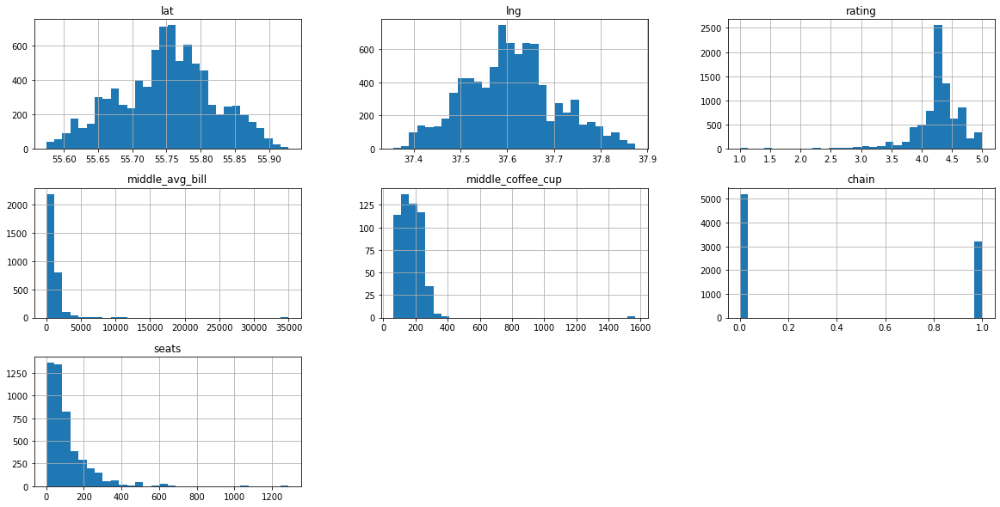

In [4]:
information(places)

### Датасет

В датасете 8406 строк и 14 столбоцов:  
 - `name`: название заведения;  
 - `category`: категория заведения (кафе/ресторан/т.д.);  
 - `address`: адрес заведения;  
 - `district`: административный район;  
 - `hours`: время работы;  
 - `lat`: широта географической точки, в которой находится заведение;  
 - `lng`: долгота географической точки, в которой находится заведение;  
 - `rating`: рейтинг заведения по оценкам пользователей в Яндекс Картах;  
 - `price`: категория цен;  
 - `avg_bill`: средняя стоимость заказа в виде диапазона;  
 - `middle_avg_bill`: средний чек в виде числа (если в `avg_bill` диапазон, то выводится медианное значение; если указано одно число, то указывается одно; в противном случае - ничего не указывается);  
 - `middle_coffee_cup`: цена чашки капучино;  
 - `chain`: является ли заведение сетевым (0 - нет, 1 - да);  
 - `seats`: количество посадочных мест.  
 
Явные дубликаты отсутствуют. Названия столбцов приведены в соответствии со snake_case. 

### Неопределенные значения

Присутствуют неопределенные значения:
 - `hours` - неуказаны часы работы заведений;  
 - `price` - отсутствует категория средней стоимости заказа;  
 - `avg_bill` - отсутствует информация о диапазоне средней стоимости заказа;  
 - `middle_avg_bill` - отсутствует информация о средней стоимости заказа из диапазона;  
 - `middle_coffee_cup` - отсутствует цена чашки капучино - такая характеристика применима только к определенным заведениям;  
 - `seats` - отсутствует информация о количестве мест в заведении - не во всех заведениях могут быть посадочные места или это число всегда изменяется.  
 
Изучим некоторые неопределенные значения далее

#### Часы работы

In [5]:
places[places['hours'].isnull()].groupby('category')['address'].count()

category
бар,паб             18
булочная             7
быстрое питание     33
кафе               375
кофейня             15
пиццерия             5
ресторан            74
столовая             9
Name: address, dtype: int64

Больше всего заведений с неопределенными значениями представляют кафе

array([[<AxesSubplot:title={'center':'lat'}>,
        <AxesSubplot:title={'center':'lng'}>,
        <AxesSubplot:title={'center':'rating'}>],
       [<AxesSubplot:title={'center':'middle_avg_bill'}>,
        <AxesSubplot:title={'center':'middle_coffee_cup'}>,
        <AxesSubplot:title={'center':'chain'}>],
       [<AxesSubplot:title={'center':'seats'}>, <AxesSubplot:>,
        <AxesSubplot:>]], dtype=object)

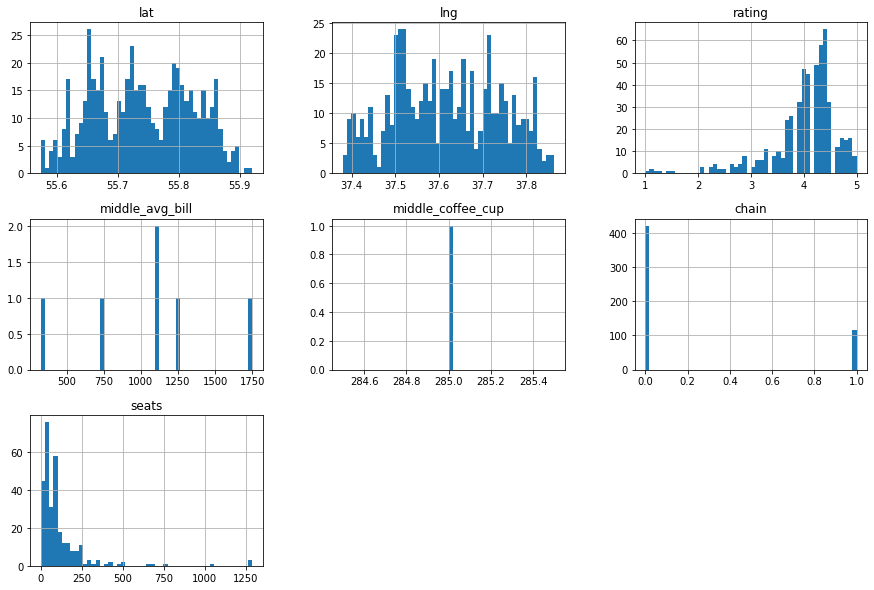

In [6]:
places[places['hours'].isnull()].hist(bins=50, figsize = (15, 10))

Заведения с неопреденными значениями в столбце с часами работы не имеют географической зависимости. В основном такие заведения имеют рейтинг от 3.7 до 4.5. Всего 6 заведений из списка имеют среднюю стоимость заказа и только одно среднюю стоимость чашки капучино

#### Средняя стоимость заказа

In [7]:
places[places['middle_avg_bill'].isnull()].groupby('category')['address'].count()

category
бар,паб             416
булочная            203
быстрое питание     366
кафе               1684
кофейня            1213
пиццерия            238
ресторан           1003
столовая            134
Name: address, dtype: int64

В основном средняя стоимость заказа отсутствует у кафе, кофеен и ресторанов

array([[<AxesSubplot:title={'center':'lat'}>,
        <AxesSubplot:title={'center':'lng'}>,
        <AxesSubplot:title={'center':'rating'}>],
       [<AxesSubplot:title={'center':'middle_avg_bill'}>,
        <AxesSubplot:title={'center':'middle_coffee_cup'}>,
        <AxesSubplot:title={'center':'chain'}>],
       [<AxesSubplot:title={'center':'seats'}>, <AxesSubplot:>,
        <AxesSubplot:>]], dtype=object)

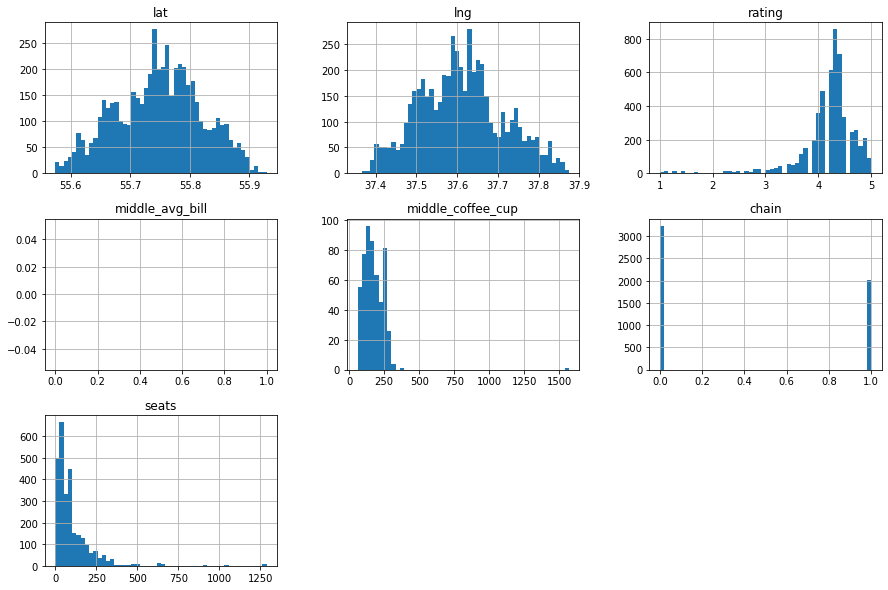

In [8]:
places[places['middle_avg_bill'].isnull()].hist(bins=50, figsize = (15, 10))

Характер распределения заведений с пропущенными значениями в зависимости от географического расположения идентично общему. 

#### Средняя стоимость чашки капучино

In [9]:
(places.query('middle_coffee_cup.isnull() and category == "кофейня"').count()/places.query('category == "кофейня"').count())

name                 0.631281
category             0.631281
address              0.631281
district             0.631281
hours                0.628040
lat                  0.631281
lng                  0.631281
rating               0.631281
price                0.434874
avg_bill             0.277393
middle_avg_bill      1.000000
middle_coffee_cup    0.000000
chain                0.631281
seats                0.612517
dtype: float64

У 63% кофеен отсутствует средняя цена чашки капучино

array([[<AxesSubplot:title={'center':'lat'}>,
        <AxesSubplot:title={'center':'lng'}>,
        <AxesSubplot:title={'center':'rating'}>],
       [<AxesSubplot:title={'center':'middle_avg_bill'}>,
        <AxesSubplot:title={'center':'middle_coffee_cup'}>,
        <AxesSubplot:title={'center':'chain'}>],
       [<AxesSubplot:title={'center':'seats'}>, <AxesSubplot:>,
        <AxesSubplot:>]], dtype=object)

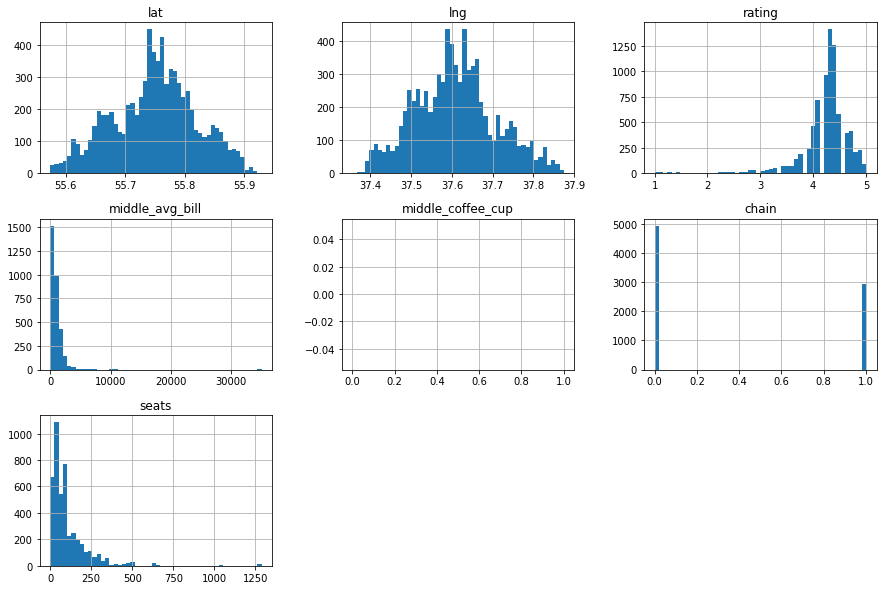

In [10]:
places[places['middle_coffee_cup'].isnull()].hist(bins=50, figsize = (15, 10))

Распределения не отличаются от общих

### Распределения данных

array([[<AxesSubplot:title={'center':'lat'}>,
        <AxesSubplot:title={'center':'lng'}>,
        <AxesSubplot:title={'center':'rating'}>],
       [<AxesSubplot:title={'center':'middle_avg_bill'}>,
        <AxesSubplot:title={'center':'middle_coffee_cup'}>,
        <AxesSubplot:title={'center':'chain'}>],
       [<AxesSubplot:title={'center':'seats'}>, <AxesSubplot:>,
        <AxesSubplot:>]], dtype=object)

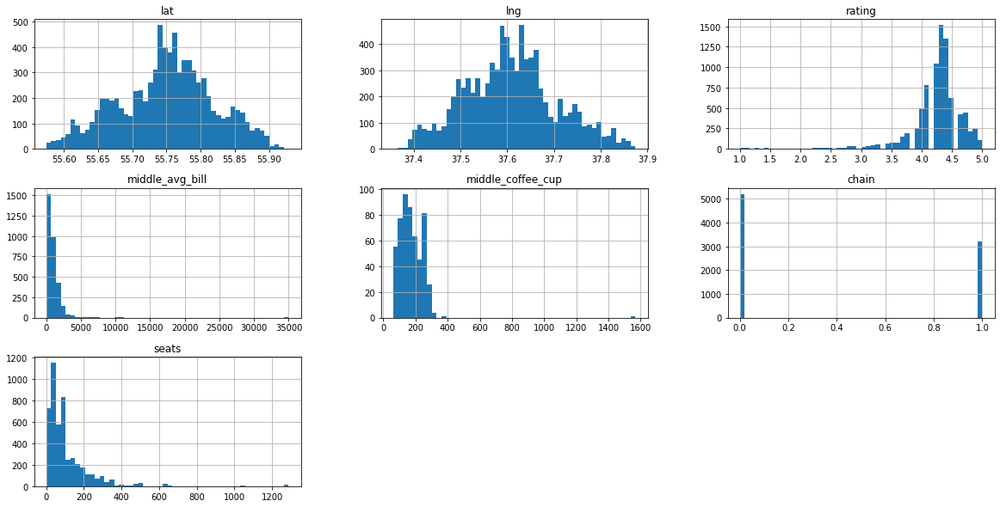

In [11]:
places.hist(bins=50, figsize = (20, 10))

In [12]:
places.describe(percentiles=[0.05, 0.1, 1/4, 1/2, 3/4, 0.9, 0.95, 0.99]).T

,count,mean,std,min,5%,10%,25%,50%,75%,90%,95%,99%,max
lat,8406.0,55.750109,0.069658,55.573942,55.627059,55.653317,55.705155,55.753425,55.795041,55.845332,55.865220,55.895390,55.928943
lng,8406.0,37.608570,0.098597,37.355651,37.444469,37.483584,37.538583,37.605246,37.664792,37.747279,37.785282,37.839273,37.874466
rating,8406.0,4.229895,0.470348,1.000000,3.400000,3.800000,4.100000,4.300000,4.400000,4.700000,4.800000,5.000000,5.000000
middle_avg_bill,3149.0,958.053668,1009.732845,0.000000,225.000000,275.000000,375.000000,750.000000,1250.000000,2000.000000,2250.000000,3750.000000,35000.000000
middle_coffee_cup,535.0,174.721495,88.951103,60.000000,60.000000,90.000000,124.500000,169.000000,225.000000,256.000000,275.000000,309.900000,1568.000000
chain,8406.0,0.381275,0.485729,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
seats,4795.0,108.421689,122.833396,0.000000,6.000000,16.000000,40.000000,75.000000,140.000000,240.000000,307.000000,625.000000,1288.000000


В основном заведения находятся между 55.65 и 55.85 по широте и 37.49-37.67 по долготе - из них больше всего между 55.76 и 55.8 по широте и 37.58-37.66 по долготе. Больше всего заведений имеют рейтинг от 4 до 4.5. Средняя стоимость заказов составляет до 3750 рублей, однако присутствуют заведения, имеющее аномально больший средний чек, например, 35000 рублей. Средняя цена капучино составляет до 309.9 рублей, но есть заведения, которые имеют гораздо большую цену, например, 1568 рублей. В основном количество мест составляет до 625, но максимальное количество мест составляет 1288.

### Вывод

1. В изначальном датасете 8406 записей;  
2. Были обнаружены неопределенные значения, однако заменить их не является возможным;  
3. В основном заведения располагаются между 55.65-55.85 по широте и 37.49-37.67 по долготе. Больше всего заведений находятся между 55.76-55.8 по широте и 37.58-37.66 по долготе;  
4. Больше все всего заведений имеют рейтинг от 4 до 4.5;  
5. Средняя стоимость заказов составляет до 3750 рублей, однако были обнаружены заведения с аномально большим чеков - такие заведения должны быть удалены из датасета;  
6. Средняя цена капучино составляет до 309.9, но некоторые заведения также имеют аномальную цену - такие заведения также следует удалить из датасета для дальнейшего анализа;  
7. В основном количество мест достигает 625, но максимальное - 1288.

## Предобработка данных

In [13]:
df = places.copy()

### Дубликаты

Ранее была проведена проверка на явные дубликаты, которые не были обнаружены. Проведем поиск неявных дубликатов на основе названия заведения и адреса

In [14]:
df['name'] = df['name'].str.lower()
df['address'] = df['address'].str.lower()

In [15]:
df.duplicated(subset = ['name', 'address']).sum()

4

Обнаружено 4 дубликата - избавимся от них

In [16]:
df.drop_duplicates(subset = ['name', 'address'], inplace = True)
df.duplicated(subset = ['name', 'address']).sum()

0

Неявные дубликаты удалены

In [17]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8402 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8402 non-null   object 
 1   category           8402 non-null   object 
 2   address            8402 non-null   object 
 3   district           8402 non-null   object 
 4   hours              7867 non-null   object 
 5   lat                8402 non-null   float64
 6   lng                8402 non-null   float64
 7   rating             8402 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8402 non-null   int64  
 13  seats              4792 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 984.6+ KB


### Пропуски в данных

Ранее были изучены неопределенные значения в датасете. Столбцы, где наблюдаются наибольшие пропуски, связаны между собой, поэтому их удаление может привести к существенной потере данных. Пропуски в столбце с обозначением количества сидячих мест могут быть связаны с тем, что заведения их не имеют

### Столбец с обозначением улицы

Выведем название улицы в отдельную ячейку

In [18]:
(df[df['address'].str.contains('округ')].shape[0] +
 df[~df['address'].str.contains('округ') & ~df['address'].str.contains('МКАД')].shape[0])

8402

Определены все типы адресов

In [19]:
def streets(row):
    if row['address'].find('округ') > 0:
        street = row['address'][row['address'].rfind(',') + 2:]
    else:
        start = row['address'].find(',')
        end = row['address'].find(',', start + 1)
        street = row['address'][start + 2:end]
    return street

df['street'] = df.apply(streets, axis = 1)
df[['address', 'street']].sample(5)

,address,street
5867,"москва, улица маршала неделина, 23",улица маршала неделина
8374,"москва, волгоградский проспект, 46/15к3а",волгоградский проспект
1713,"москва, новодмитровская улица, 5а, стр. 2",новодмитровская улица
5057,"москва, улица рогожский вал, 5, стр. 1",улица рогожский вал
3251,"москва, площадь победы, 3",площадь победы


### Столбец с обозначением работы заведений 24/7

In [20]:
df['is_24'] = df['hours'].str.contains('ежедневно, круглосуточно')
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица,False
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко,False
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица,False


### Вывод

1. Были обнаружены и удалены неявные дубликаты;  
2. Пропуски в данных с информацией о количестве сидячих мест могут быть связаны с тем, что заведения могут их не иметь;  
3. Были созданы столбцы с названием улицы и со значениями, обозначающими работу заведений 24/7.

## Анализ данных

In [21]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8402 entries, 0 to 8405
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8402 non-null   object 
 1   category           8402 non-null   object 
 2   address            8402 non-null   object 
 3   district           8402 non-null   object 
 4   hours              7867 non-null   object 
 5   lat                8402 non-null   float64
 6   lng                8402 non-null   float64
 7   rating             8402 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8402 non-null   int64  
 13  seats              4792 non-null   float64
 14  street             8402 non-null   object 
 15  is_24              7867 non-null   object 
dtypes: float64(6), int64(1),

### Категории заведений

In [22]:
categories = (df.pivot_table(index = 'category', values = 'address', aggfunc = 'count')
              .rename(columns = {'address':'count'})
              .reset_index().sort_values('count', ascending = False))
categories

,category,count
3,кафе,2376
6,ресторан,2042
4,кофейня,1413
0,"бар,паб",764
5,пиццерия,633
2,быстрое питание,603
7,столовая,315
1,булочная,256


Text(0, 0.5, 'Количество')

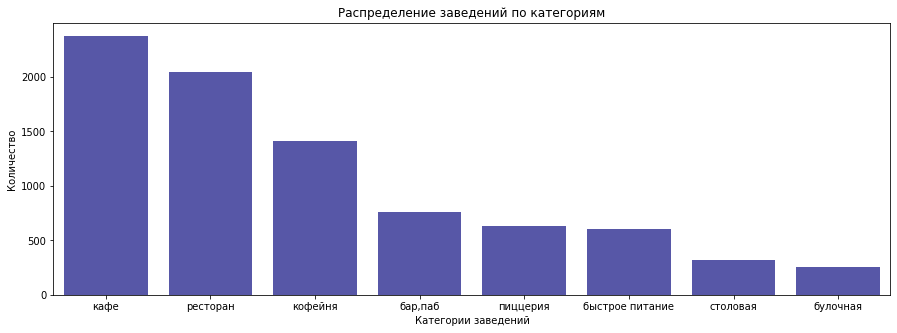

In [23]:
plt.figure(figsize=(15,5))
sns.barplot(data = categories, x = 'category', y = 'count', color = '#4a4ab4')
plt.title('Распределение заведений по категориям')
plt.xlabel('Категории заведений')
plt.ylabel('Количество')

В данных представлены заведения следующих категорий:  
1. кафе;  
2. ресторан;
3. кофейня;  
4. бар, паб;  
5. пиццерия;  
6. быстрое питание;  
7. столовая;  
8. булочная.  

Из представленных заведений больше всего кафе, ресторанов и кофеен. Меньше всего представлено столовых и булочных.

### Количество посадочных мест по категориям заведений

In [24]:
seats_by_cat = (df.pivot_table(index = 'category', values = 'seats', aggfunc = ('median')).reset_index().sort_values('seats', ascending = False))
seats_by_cat

,category,seats
6,ресторан,86.0
0,"бар,паб",82.0
4,кофейня,80.0
7,столовая,75.5
2,быстрое питание,65.0
3,кафе,60.0
5,пиццерия,55.0
1,булочная,50.0


Text(0, 0.5, 'Количество сидячих мест')

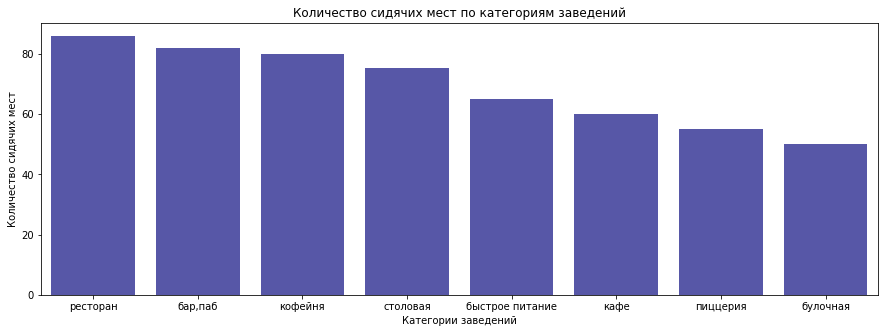

In [25]:
plt.figure(figsize=(15,5))
sns.barplot(data = seats_by_cat, x = 'category', y = 'seats', color = '#4a4ab4')
plt.title('Количество сидячих мест по категориям заведений')
plt.xlabel('Категории заведений')
plt.ylabel('Количество сидячих мест')

Больше всего мест в ресторанах, барах/пабах, кофейнях и столовых. Причиной этого может служить то, что такие заведения пользуются большой популярностью для клиентов определенных категорий

### Отношение сетевых и не сетевых заведений

In [26]:
print('Всего в датасете', df['chain'].sum(), 'сетевых заведений, что составляет', df['chain'].sum() / df['chain'].count(), 'от общего числа заведений')

Всего в датасете 3203 сетевых заведений, что составляет 0.3812187574387051 от общего числа заведений


In [27]:
chains = df['chain'].value_counts().reset_index()
chains.columns = ['chain', 'count']
chains

,chain,count
0,0,5199
1,1,3203


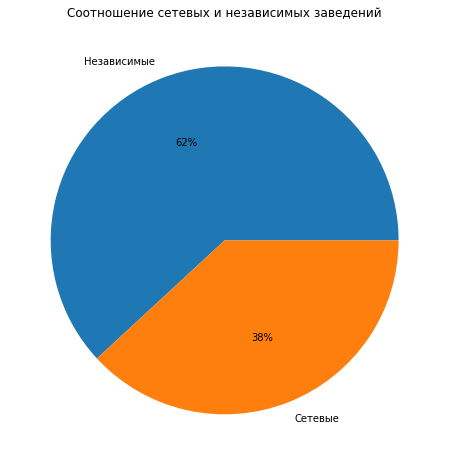

In [28]:
plt.figure(figsize = (8,8))
plt.pie(data = chains, x = 'count', labels = ['Независимые', 'Сетевые'], autopct='%.0f%%')
plt.title('Соотношение сетевых и независимых заведений')
plt.show()

В датасете 38% заведений являются сетевыми

### Сетевые заведения по категориям

In [29]:
chain_by_cat = df.pivot_table(index = 'category',
                              values = 'chain',
                              aggfunc = ['sum', 'count']).reset_index().droplevel(1, axis = 1).rename(columns = {'sum':'chain'})
chain_by_cat['fract'] = chain_by_cat['chain'] / chain_by_cat['count']
chain_by_cat = chain_by_cat.sort_values('fract', ascending = False)
chain_by_cat

,category,chain,count,fract
1,булочная,157,256,0.613281
5,пиццерия,330,633,0.521327
4,кофейня,720,1413,0.509554
2,быстрое питание,232,603,0.384743
6,ресторан,729,2042,0.357003
3,кафе,779,2376,0.327862
7,столовая,88,315,0.279365
0,"бар,паб",168,764,0.219895


Text(0, 0.5, 'Категории заведений')

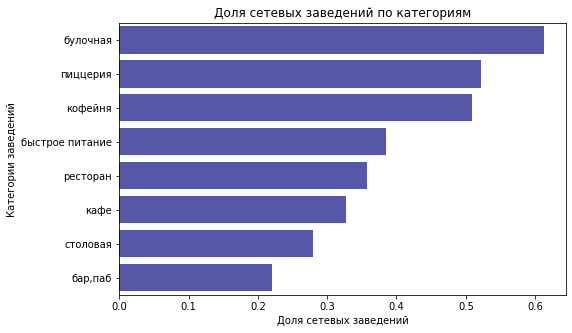

In [30]:
plt.figure(figsize = (8,5))
sns.barplot(data = chain_by_cat, x = 'fract', y = 'category', color = '#4a4ab4')
plt.title('Доля сетевых заведений по категориям')
plt.xlabel('Доля сетевых заведений')
plt.ylabel('Категории заведений')

62% булочных являются сетевыми;  
52% и 51% пиццерий и кофеен соответственно являются сетевыми;  
Среди заведений быстрого питания 38% являются сетевыми.

### Топ-15 популярных сетей в Москве

In [31]:
top_15_chain = (df[df['chain'] == 1].pivot_table(index = ['name', 'category'],
                                                 values = 'chain',
                                                 aggfunc = 'sum')
                .reset_index()
                .sort_values('chain', ascending = False)).head(15)

top_15_chain

,name,category,chain
1126,шоколадница,кофейня,119
496,домино'с пицца,пиццерия,76
489,додо пицца,пиццерия,74
205,one price coffee,кофейня,71
1142,яндекс лавка,ресторан,69
72,cofix,кофейня,65
241,prime,ресторан,49
617,кофепорт,кофейня,42
632,кулинарная лавка братьев караваевых,кафе,39
963,теремок,ресторан,36


Text(0, 0.5, 'Сетевые заведения')

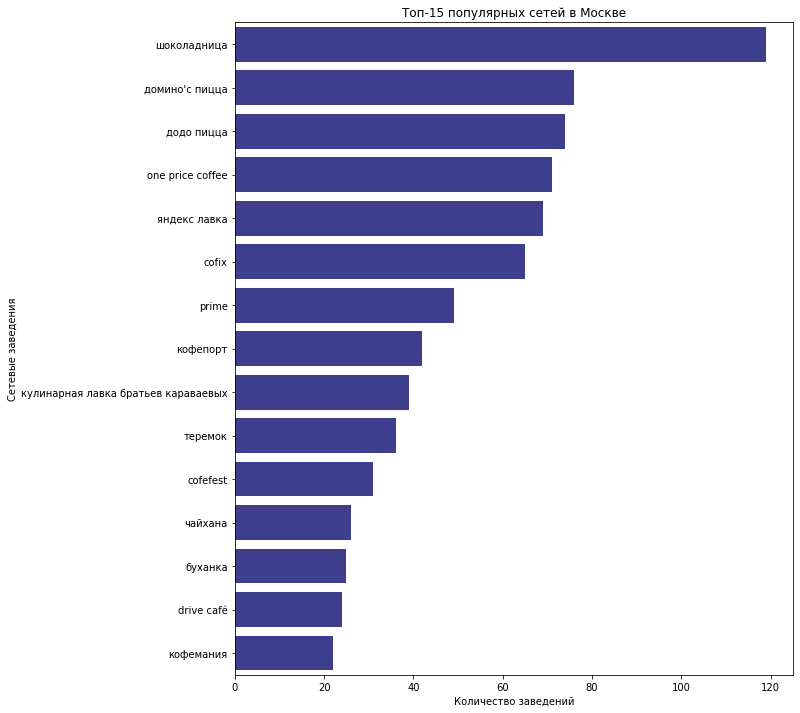

In [32]:
plt.figure(figsize = (10,12))
sns.barplot(data = top_15_chain, x = 'chain', y = 'name', color = '#31319b')
plt.title('Топ-15 популярных сетей в Москве')
plt.xlabel('Количество заведений')
plt.ylabel('Сетевые заведения')

Наибольшую популярность с отрывом в 43 заведения имеет сеть "Шоколадница". Затем следуют сети пиццерий "Доммино'с пицца" и "Додо пицца". Верхние позиции рейтинга являются одними из самых растиражированных в своих категориях. Рассмотрим распределение топ-15 заведений по категориям.

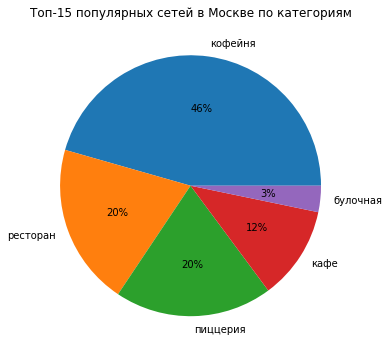

In [33]:
plt.figure(figsize = (6,6))
plt.pie(data = (top_15_chain.drop(columns = 'name')
                    .groupby('category')
                    .sum()
                    .reset_index()
                    .sort_values('chain', ascending = False)),
        x = 'chain', labels = 'category', autopct='%.0f%%')
plt.title('Топ-15 популярных сетей в Москве по категориям')
plt.show()

Наибольшую популярность имеют кофейни с отрывом почти в 200 заведений. Такой отрыв может быть связан с тем, что аудитория таких заведений является самой наибольшей - офисов сотрудников, наиболее распространенных в Москве.

### Административные районы

In [34]:
categories_by_district = df.pivot_table(index = ['district', 'category'], values = 'address', aggfunc = 'count').reset_index().rename(columns = {'address':'count'})
categories_by_district

,district,category,count
0,Восточный административный округ,"бар,паб",53
1,Восточный административный округ,булочная,25
2,Восточный административный округ,быстрое питание,71
3,Восточный административный округ,кафе,272
4,Восточный административный округ,кофейня,105
...,...,...,...
67,Южный административный округ,кафе,264
68,Южный административный округ,кофейня,131
69,Южный административный округ,пиццерия,73
70,Южный административный округ,ресторан,202


In [35]:
districts = {'Восточный административный округ':'ВАО',
            'Западный административный округ':'ЗАО',
            'Северный административный округ':'САО',
            'Южный административный округ':'ЮАО',
            'Центральный административный округ':'ЦАО',
            'Северо-Восточный административный округ':'СВАО',
            'Северо-Западный административный округ':'СЗАО',
            'Юго-Восточный административный округ':'ЮВАО',
            'Юго-Западный административный округ':'ЮЗАО'}
categories_by_district['district'] = categories_by_district['district'].replace(districts)
categories_by_district

,district,category,count
0,ВАО,"бар,паб",53
1,ВАО,булочная,25
2,ВАО,быстрое питание,71
3,ВАО,кафе,272
4,ВАО,кофейня,105
...,...,...,...
67,ЮАО,кафе,264
68,ЮАО,кофейня,131
69,ЮАО,пиццерия,73
70,ЮАО,ресторан,202


In [36]:
categories_by_district.groupby('district')['count'].sum().sort_values(ascending=False)

district
ЦАО     2242
САО      898
ЮАО      892
СВАО     890
ЗАО      850
ВАО      798
ЮВАО     714
ЮЗАО     709
СЗАО     409
Name: count, dtype: int64

In [38]:
fig = px.bar(categories_by_district,
            x = 'count',
            y = 'district',
            color = 'category',
            width=900, height=800)

fig.update_layout(title = 'Количество заведений каждой категории по районам',
                 xaxis_title = 'Количество заведений',
                 yaxis_title = 'Районы',
                 yaxis = {'categoryorder':'total ascending'}
                 )


Больше всего заведений находится в Центральном административном округе - наиболее посещаемом отдыхающими и имеющем наибольшее количество офисов на территории. Далее районы идут в следующем порядке: 
- САО - в данном районе расположены несколько крупных ТЦ, стадионы ЦСКА и Динамо, на соседних станциях находятся ВУЗы "МАИ", "МАДИ", а также подразделение Финансового университета;  
- ЮАО - крупнейший по населению округ Москвы;  
- СВАО - на территории округа расположены ВДНХ, ботанический сад и Останкино, а также крупные спальные районы;  
- ЗАО - на территории района располагается МГУ, парковые зоны отдыха, Киевский вокзал и Лужники. Помимо этого, на территории района располагаются Воробьевы горы, на территории которых проводится большое количество мероприятий - в т.ч. свадебные, которые требуют удобного расположения ресторанов и кафе вблизи;  
- ВАО - на территории района находится крупный парк Сокольники, а также крупные спальные районы такие, как Новогиреево, Перово и Измайлово;  
- ЮВАО - на территории района расположились спальные районы: Выхино, Люблино, Марьино и т.д. Помимо этого Выхино является пересадочным пунктом для жителей Люберец;  
- ЮЗАО - часть округа занимают спальные районы, ВУЗы. Помимо этого, округ близко расположен к местам привлечения людей в ЗАО;  
- СЗАО - наименьший округ по количеству заведений, разница с ЮЗАО составляет - 300 заведений. Это может быть связано с тем, что большую часть района занимают зоны природного отдыха, а из спальных районов в данном округе располагаются только Митино, Северное Тушино и Южное Тушино

### Рейтинги по категориям

In [39]:
rate_by_categories = (df
                      .groupby('category')['rating']
                      .agg(['mean', 'median'])
                      .reset_index()
                      .sort_values('mean', ascending = False))
rate_by_categories['mean'] = rate_by_categories['mean'].round(2)
rate_by_categories

,category,mean,median
0,"бар,паб",4.39,4.4
5,пиццерия,4.30,4.3
6,ресторан,4.29,4.3
4,кофейня,4.28,4.3
1,булочная,4.27,4.3
7,столовая,4.21,4.3
3,кафе,4.12,4.2
2,быстрое питание,4.05,4.2


In [40]:
df['rating'].median()

4.3

Text(0, 0.5, 'Категории заведений')

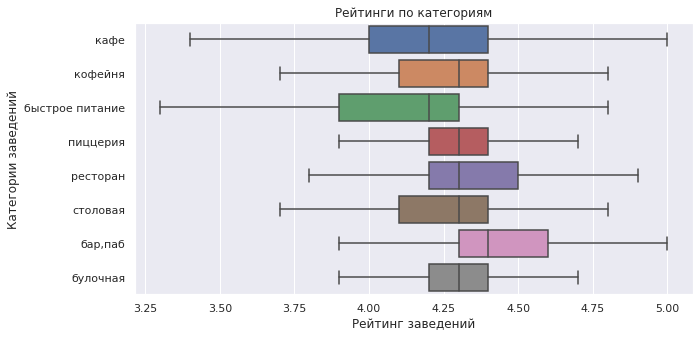

In [41]:
sns.set(rc={'figure.figsize':(10,5)})
sns.boxplot(data = df.sort_values('rating', ascending = False), x = 'rating', y = 'category', showfliers = False)
plt.title('Рейтинги по категориям')
plt.xlabel('Рейтинг заведений')
plt.ylabel('Категории заведений')

В основном средний рейтинг заведений составляет от 3.9 до 4.6. Наибольший рейтинг имеют бар и пабы - среднее значение приближено к минимальному, что говорит о том, что большинство заведений имеет рейтинг выше 4.3. Наименьший рейтинг имеют кафе и заведения быстрого питания, однако разница среднего рейтинга между заведениями разных категорий не является большой

### Картограмма со средним рейтингом заведений каждого района

In [42]:
import json
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

In [43]:
rating_by_district = (df
                      .pivot_table(index ='district',
                                   values = 'rating',
                                   aggfunc = 'mean')
                      .reset_index()
                      .sort_values('rating', ascending = False)
                      .round(1))

rating_by_district


,district,rating
5,Центральный административный округ,4.4
2,Северный административный округ,4.2
4,Северо-Западный административный округ,4.2
8,Южный административный округ,4.2
1,Западный административный округ,4.2
0,Восточный административный округ,4.2
7,Юго-Западный административный округ,4.2
3,Северо-Восточный административный округ,4.1
6,Юго-Восточный административный округ,4.1


In [44]:
moscow_lat = 55.751244
moscow_lng = 37.618423

m = Map(location = [moscow_lat, moscow_lng])

Choropleth(geo_data = '/datasets/admin_level_geomap.geojson' , 
          data = rating_by_district,
          columns = ['district', 'rating'],
          key_on = 'feature.name',
          legend_name = 'Средний рейтинг заведений по районам').add_to(m)
m

Максимальный рейтинг имеют заведения в ЦАО

### Картограмма со средним рейтингом заведений каждого района с кластерами

In [45]:
moscow_lat = 55.751244
moscow_lng = 37.618423

m = Map(location = [moscow_lat, moscow_lng])
marker_cluster = MarkerCluster().add_to(m)

def clusters(row):
    Marker([row['lat'], row['lng']],
           popup = f"{row['name']} {row['rating']}").add_to(marker_cluster)
df.apply(clusters, axis = 1)
m

Как и было отмечено раньше, больше всего заведений располагается в центре. При этом распределение заведений соответствует аргументации о количестве заведений по районам

### Топ-15 улиц по количеству заведений

In [46]:
top15_streets = df[df['street'].notnull()]['street'].value_counts().reset_index().head(15)
top15_streets.columns = ['street', 'count']
top15_streets

,street,count
0,проспект мира,183
1,профсоюзная улица,122
2,проспект вернадского,108
3,ленинский проспект,107
4,ленинградский проспект,95
5,дмитровское шоссе,88
6,каширское шоссе,77
7,варшавское шоссе,75
8,ленинградское шоссе,69
9,мкад,65


In [47]:
streets_to_category = df.groupby(['street', 'category'])['address'].count().reset_index()
streets_to_category.columns = ['street', 'category', 'count']
streets_to_category.head()

,street,category,count
0,1-й автозаводский проезд,кафе,1
1,1-й балтийский переулок,ресторан,1
2,1-й варшавский проезд,кафе,1
3,1-й вешняковский проезд,кафе,1
4,1-й волоколамский проезд,кафе,1


In [48]:
top15_streets_to_category = streets_to_category[streets_to_category['street'].isin(top15_streets['street'])]
top15_streets_to_category

,street,category,count
721,варшавское шоссе,"бар,паб",6
722,варшавское шоссе,быстрое питание,7
723,варшавское шоссе,кафе,17
724,варшавское шоссе,кофейня,14
725,варшавское шоссе,пиццерия,4
...,...,...,...
3220,улица миклухо-маклая,быстрое питание,4
3221,улица миклухо-маклая,кафе,21
3222,улица миклухо-маклая,кофейня,4
3223,улица миклухо-маклая,пиццерия,2


In [49]:
fig = px.bar(top15_streets_to_category,
            x = 'count',
            y = 'street',
            color = 'category',
            width=1050, height=500)

fig.update_layout(title = 'Количество заведений каждой категории по улицам',
                 xaxis_title = 'Количество заведений',
                 yaxis_title = 'Улицы',
                 yaxis = {'categoryorder':'total ascending'}
                 )


Наибольшее количество заведений располагается на Проспекте Мира, где наиболее преобладают кафе и рестораны. Далее распредение заведений по улицам идет более плавно. Наибольшая доля кафе располагается на МКАД'е - это может быть связано с тем, что они расчитаны на проезжающих водителей, которым требуется отдых в дороге.

### Улицы с одним заведением

In [50]:
one_street = df[df['street'].notnull()]['street'].value_counts().reset_index()
one_street.columns = ['street', 'count']
one_street = one_street[one_street['count'] == 1]
one_street.head()

,street,count
988,2-й квартал капотни,1
989,3-й михалковский переулок,1
990,156,1
991,лечебная улица,1
992,сквер имени м.и. калинин,1


In [51]:
one_street['street'].count()

516

In [52]:
(streets_to_category[streets_to_category['street']
                     .isin(one_street['street'])]
 .groupby('category')['street']
 .count()
 .sort_values(ascending = False))

category
кафе               180
ресторан            98
кофейня             97
бар,паб             43
столовая            40
быстрое питание     29
пиццерия            17
булочная            12
Name: street, dtype: int64

457 имеют одно заведение - большинство из них являются кафе

### Значения средних чеков заведений

In [53]:
mean_bill = places.groupby('district')['middle_avg_bill'].median().reset_index().sort_values('middle_avg_bill')
mean_bill

,district,middle_avg_bill
6,Юго-Восточный административный округ,450.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
0,Восточный административный округ,575.0
7,Юго-Западный административный округ,600.0
2,Северный административный округ,650.0
4,Северо-Западный административный округ,700.0
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0


In [54]:
moscow_lat = 55.751244
moscow_lng = 37.618423

m = Map(location = [moscow_lat, moscow_lng])

Choropleth(geo_data = '/datasets/admin_level_geomap.geojson' , 
          data = mean_bill,
          columns = ['district', 'middle_avg_bill'],
          key_on = 'feature.name',
          legend_name = 'Средний чек заведений по районам').add_to(m)
m

Наибольший средний чек в ЦАО и ЗАО, но наименьший средний чек в Юго-Восточном административном округе - в одном из лидеров по количеству заведений

### Вывод

1. Чаще всего в датасете присутствуют кафе, рестораны и кафе. Типы заведений в датасете: кафе, ресторан, кофейня, бар/паб, пиццерия, быстрое питание, столовая и балочная;  
2. Больше всего сидячих мест в ресторанах, барах/пабах, кофейнях и столовых - все эти заведения нацелены на определенную аудиторию. Чаще всего рестораны нацелены на конкретную кухню, бары/пабы нацелены на аудиторию, потребляющую алкогольные напитки, кофейни являются весьма заведениями среди офисных сотрудников, а столовые на студентов;  
3. В полученном датасете 38% заведений являются сетевыми;  
4. Было изучено распределение сетевых заведений по категориям. В категориях булочных, пиццерий и кофеен больше половины заведений являются сетевыми;  
5. Был получени топ-15 популярных сетей в Москве. В данном случае под популярностью понимаются сети, имеющие наибольшее количество заведений. Самой популярной является сеть кофеен  "Шоколадница", второе и третье место занимают сети пиццерий "Домино'с Пицца" и "Додо Пицца". При этом во всем топ-15 сетей наиболее распространены кофейни;  
6. Больше всего заведений находятся в ЦАО. В САО, ЮАО, СВАО и ЗАО количество заведений находится между 850 и 900. В ВАО - 798. В ЮВАО и ЮЗАО - 714 и 709 заведений, соответственно. В СЗАО наименьшее количество заведений - 409. В ЦАО распрастраненность заведений наибольшая с отрывом от остальных - этот район имеет наибольшую посещаемость отдыхающими, а также большое количество офисов. У остальных районов количество заведений более равное по сравнению с ЦАО - в таких районах количество заведений может быть связано с расположением мест интереса населения - прогулочные зоны, торговые центры, места проведения мероприятий - и спальных районов;  
7. Был изучен средний рейтинг заведений по категориям. Наибольший рейтинг среди баров/пабов - при этом среднее значение приближено к медианному, что говорит о том, что мало заведений с низким рейтингом - т.е. нет перевеса в отрицательную сторону. Наименьший рейтинг у заведений быстрого питания;  
8. Была составлена картограмма со средним рейтингом заведений каждого района. Наибольший рейтинг имеют заведения, расположенные в ЦАО - 4.4. В остальных районах рейтинг составляет 4.2 - средний по Москве. Наименьший рейтинг у заведений в СВАО и ЮВАО;  
9. Была составлена картограмма со средним рейтингом заведений каждого с кластерами. Заведения распределены так, как это отмечено в пояснении к распределению заведений по районам;  
10. Был составлен Топ-15 улиц по количеству заведений. Наибольшее количество заведений находится на Проспекте Мира - 183, Профсоюзной улице - 122, Проспекте Вернадского и Ленинском проспекте - по 108 и 107, соответственно. На этих улицах больше всего кафе и ресторанов. На МКАД'е среди всех заведений наиболее распространены кафе - это может быть связано с тем, что они расчитаны на проезжающих водителей;  
11. Были выявлены улицы с одним заведением. Всего таких улиц 457 - большинство из заведений, расположенных на этих улицах - кафе;  
12. Были рассмотрены значения среднего чека по районам. Наибольший средний чек в ЦАО и ЗАО, а наименьший в ЮВАО.

## Открытие кофейни

Необходимо проанализировать данные по заведениям Москвы из категории "Кофейни"

### Изучение распределения кофеен по районам

In [55]:
coffee_all = df[df['category'] == 'кофейня']['address'].count()
coffee_all

1413

Всего в датасете 1413 кофеен

In [56]:
coffee_by_district = (df[df['category'] == 'кофейня']
                      .pivot_table(index = 'district',
                                   values = 'address',
                                   aggfunc = 'count')
                      .reset_index()
                      .rename(columns = {'address':'count'})
                      .sort_values('count', ascending = False))
coffee_by_district['fract'] = (coffee_by_district['count'] / coffee_all).round(2)
coffee_by_district

,district,count,fract
5,Центральный административный округ,428,0.30
2,Северный административный округ,193,0.14
3,Северо-Восточный административный округ,159,0.11
1,Западный административный округ,150,0.11
8,Южный административный округ,131,0.09
0,Восточный административный округ,105,0.07
7,Юго-Западный административный округ,96,0.07
6,Юго-Восточный административный округ,89,0.06
4,Северо-Западный административный округ,62,0.04


In [57]:
moscow_lat = 55.751244
moscow_lng = 37.618423

m = Map(location = [moscow_lat, moscow_lng])

Choropleth(geo_data = '/datasets/admin_level_geomap.geojson' , 
          data = coffee_by_district,
          columns = ['district', 'count'],
          key_on = 'feature.name',
          legend_name = 'Количество кофеен по районам').add_to(m)
m

Больше всего кофеен в центре. Среднее количество заведений в СВАО и ЗАО. В САО количество заведений выше среднего

In [58]:
moscow_lat = 55.751244
moscow_lng = 37.618423

m = Map(location = [moscow_lat, moscow_lng])
marker_cluster = MarkerCluster().add_to(m)

def clusters(row):
    Marker([row['lat'], row['lng']],
           popup = f"{row['name']} {row['rating']}").add_to(marker_cluster)
df[df['category'] == 'кофейня'].apply(clusters, axis = 1)
m

Больше всего кофеен расположены близ мест скопления людей: метро, торговые центры, офисы, вокзалы, ВУЗы и пересадочные пункты -  в местах, где проходит большинство людей. Это означает, что такие заведения ориентируются на массовость потока клиентов.

### Исследование круглосуточных кофеен

In [59]:
coffee_by_district = (df.query('(category == "кофейня") and (is_24 == True)')
                      .pivot_table(index = ['district', 'chain'],
                                   values = 'address',
                                   aggfunc = 'count')
                      .reset_index()
                      .rename(columns = {'address':'count'})
                      .sort_values('count', ascending = False))
coffee_by_district['fract'] = (coffee_by_district['count'] / coffee_by_district['count'].sum()).round(2)
coffee_by_district['chain'] = coffee_by_district['chain'].replace({1:'Сеть', 0:'Индивид.'})
coffee_by_district['district'] = coffee_by_district['district'].replace(districts)
coffee_by_district

,district,chain,count,fract
7,ЦАО,Сеть,20,0.34
2,ЗАО,Сеть,8,0.14
6,ЦАО,Индивид.,6,0.10
0,ВАО,Сеть,5,0.08
3,САО,Сеть,5,0.08
10,ЮЗАО,Сеть,5,0.08
4,СВАО,Сеть,3,0.05
5,СЗАО,Сеть,2,0.03
9,ЮЗАО,Индивид.,2,0.03
1,ЗАО,Индивид.,1,0.02


In [60]:
fig = px.sunburst(coffee_by_district, path = ['district', 'chain'], values = 'count')
fig.update_layout(title = 'Распределение количества заведений по районам и категориям', 
                 width = 800,
                 height = 600,
                 annotations = [dict(x = 1.12,
                                    y = 1.05)])
fig.show()

Больше всего круглосуточных кофеен в ЦАО - 26. Во всех районах, кроме ЦАО, ЗАО и ЮЗАО, все кофейни являются сетевыми. При этом в ЦАО доля сетевых заведений наибольшая относительно района.

### Распределение рейтингов кофеен по районам

Text(0, 0.5, 'Районы, в которых находятся заведения')

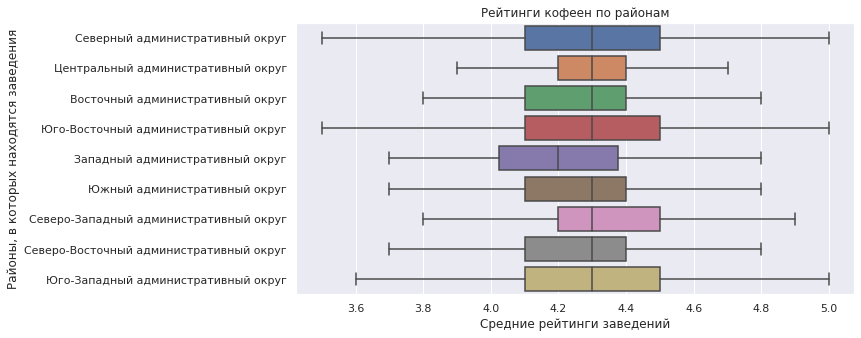

In [61]:
sns.set(rc={'figure.figsize':(10,5)})
sns.boxplot(data = (df
                    .query('(category == "кофейня")')
                    .sort_values('rating', ascending = False)),
            x = 'rating',
            y = 'district',
            showfliers = False)
plt.title('Рейтинги кофеен по районам')
plt.xlabel('Средние рейтинги заведений')
plt.ylabel('Районы, в которых находятся заведения')

Средние рейтинги во всех районах, кроме ЗАО, одинаковы. В ЗАО средний рейтинг меньше остальных районов  - это означает, что конкуренция в этом районе будет меньше, чем в остальных районах.

### Распределение стоимости чашки капучино по районам

In [62]:
coffee = (df.query('(category == "кофейня")')
          .pivot_table(index = 'district',
                       values = 'middle_coffee_cup',
                       aggfunc = 'median')
          .reset_index().sort_values('middle_coffee_cup',
                                     ascending = False))
coffee

,district,middle_coffee_cup
7,Юго-Западный административный округ,198.0
5,Центральный административный округ,190.0
1,Западный административный округ,189.0
4,Северо-Западный административный округ,165.0
3,Северо-Восточный административный округ,162.5
2,Северный административный округ,159.0
8,Южный административный округ,150.0
6,Юго-Восточный административный округ,147.5
0,Восточный административный округ,135.0


Text(0, 0.5, 'Районы, в которых находятся заведения')

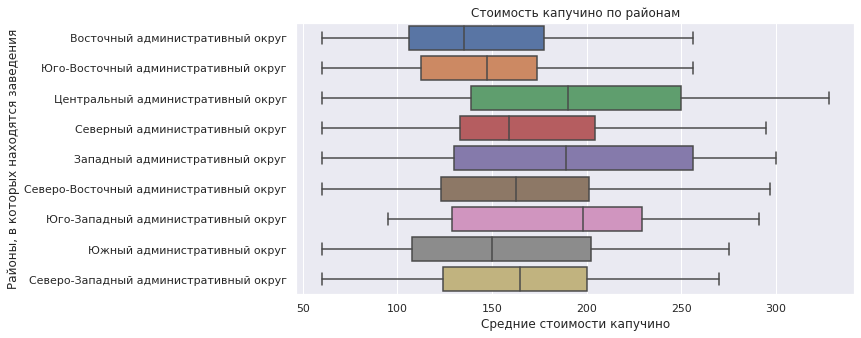

In [63]:
sns.set(rc={'figure.figsize':(10,5)})
sns.boxplot(data = (df
                    .query('(category == "кофейня")')
                    .sort_values('middle_coffee_cup', ascending = False)),
            x = 'middle_coffee_cup',
            y = 'district',
            showfliers = False)
plt.title('Стоимость капучино по районам')
plt.xlabel('Средние стоимости капучино')
plt.ylabel('Районы, в которых находятся заведения')

Наименьшая средняя стоимость капучино в ВАО и ЮВАО. В то же время в ЗАО средняя стоимость является одной из наибольших, но при этом имеет наибольший разброс основных цен. 

### Западный административный округ

По части показателей ЗАО является гибким с точки зрения ценообразования и распределения рейтингов

In [64]:
moscow_lat = 55.751244
moscow_lng = 37.618423

m = Map(location = [moscow_lat, moscow_lng])
marker_cluster = MarkerCluster().add_to(m)

def clusters(row):
    Marker([row['lat'], row['lng']],
           popup = f"{row['name']} {row['rating']}").add_to(marker_cluster)
df.query('(category == "кофейня") and (district == "Западный административный округ")').apply(clusters, axis = 1)
m

В ЗАО находятся места скопления населения, в число которых входят Киевский вокзал, Лужники, парковые зоны отдыха, смотровая площадка, а также крупный ВУЗ. Совокупность этих факторов обеспечивает высокую проходимость потенциальных клиентов - как было выяснено ранее, этот фактор является одним из решающих при выбора места аренды для кофейни. При этом в данном районе находятся две улицы, входящие в топ-15 улиц по популярности, что говорит о том, что на этих улицах повышенный спрос на заведения общественного питания.

In [65]:
gh = df.pivot_table(index = ['district', 'chain'], values = 'rating', aggfunc = 'mean').reset_index()
gh

,district,chain,rating
0,Восточный административный округ,0,4.183689
1,Восточный административный округ,1,4.156890
2,Западный административный округ,0,4.162658
3,Западный административный округ,1,4.205585
4,Северный административный округ,0,4.258877
5,Северный административный округ,1,4.212428
6,Северо-Восточный административный округ,0,4.131598
7,Северо-Восточный административный округ,1,4.175375
8,Северо-Западный административный округ,0,4.198024
9,Северо-Западный административный округ,1,4.226282


<AxesSubplot:xlabel='rating', ylabel='district'>

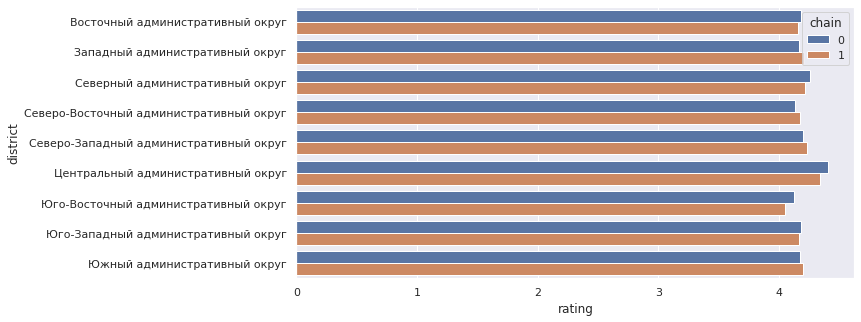

In [66]:
sns.barplot(data = gh, x = 'rating', y = 'district', hue = 'chain')

## Вывод

### Изучение данных

1. Изначальный датасет имеет 8406 записей;  
2. Были обнаружены неопределенные значения, однако заменить или удалить их не является возможным, так как объем замененных значений сильно исказит картину, как и их удаление. Явные дубликаты обнаружены не были;  
3. Были определены координаты большинства заведений: 55.76-55.8 по широте и 37.58-37.66 по долготе;  
4. Большинство заведений имеют рейтинг от 4 до 4.5;  
5. Средняя стоимость заказов составляет до 3750 рублей, однако были обнаружены заведения с аномально большим чеком - такие заведения могли негативно повлиять на дальнейшие расчеты, поэтому эти записи было необходимо удалить;  
6. Средняя цена капучино составляет до 310 рублей, но некоторые заведения также имеют аномально высокую цену - эти заведения также следовало удалить из датасета;  
7. В основном количество мест в заведения Москвы достигает 625, но максимальное - 1288.

### Предобработка данных

1. Были обнаружены неявные дубликаты - 4 записи. В этих дубликатах заведения имеют одинаковые названия и адреса в совокупности. Дубликаты были удалены;  
2. Был создан столбец с названием улицы, на которой находится заведение для дальнейшего анализа;  
3. Был отдельно выведен столбец с обозначением того, является ли заведение круглосуточным;  
4. Было обнаружено, что заведения с пропущенным значением количества сидячих мест могут их не иметь.

### Анализ данных

Чаще всего в датасете присутствуют кафе, рестораны и кофейни. Установлены категории заведений, присутствующие в датасете: кафе, ресторан, кофейня, бар/паб, пиццерия, быстрое питание, столовая и булочная. При этом меньше всего заведений в категориях "столовая" и "булочная" - такие заведения, судя по всему, пользуются минимальным спросом.

Больше всего сидячих мест в ресторанах, барах/пабах, кофейнях и столовых - это может зависит от того, что заведения нацелены на определенную аудиторию. Чаще всего рестораны нацелены на конкретную кухню, бары/пабы имеют аудиторию, потребляющую алкогольные напитки (в случае пабов это еще и аудитория спортивных фанатов). Кофейни являются популярными заведениями среди студентов, офисных сотрудников, а также прохожих. Столовые - для студентов и работающих на производствах.

В полученном датасете 38% заведений являются сетевыми. Как правило, в эти сети входят основные заведения сети, а также заведения, купившие франшизу. Было изучено распределение сетевых заведений по категориям. В категориях булочных, пиццерий и кофеен больше половины заведений являются сетевыми.  
Также определен топ-15 популярных сетей в Москве, однако в данном случае под популярностью понимаются сети, имеющие наибольшее количество заведений - в данном случае наибольшее количество заведений по сравнению с другими сетями говорит о том, что заведения данной сети пользуются популярностью, а спрос на них растет, что может дать информацию о том, какие категории заведений пользуются наибольшим спросом. Так установлено, что самой популярной является сеть кофеен "Шоколадница", на втором и третьем местах находятся сети пиццерий "Домино'с Пицца" и "Додо Пицца". При рассмотрении топ-15 сетей по категориям было установлено, что наибольшую популярность имеют кофейни с подавляющем отрывом от остальных категорий.

Был выполнен анализ по районам Москвы. Больше всего заведений находится в ЦАО. В остальных районах, кроме СЗАО, количество заведений варьируется вокруг среднего количества заведений по Москве. В СЗАО наименьшее количество заведений. В ЦАО распространенность заведений сильно отличается от остальных районов в 3 раза. Установлено, что на количество заведений в районе влияют места скопления людей и спальных районов. Был изучен средний рейтинг по категориям. Наибольший рейтинг имеют заведения, расположенные в ЦАО - 4.4. В остальных районах рейтинг составляет 4.2 - средний по Москве. Наименьший рейтинг заведений в СВАО и ЮВАО.

Был расчитан средний рейтинг заведений по категориям. Наибольший рейтинг имеют заведения из категории бар/паб - среднее значение приближено к медианному, что говорит о том, что нет перевеса в оценках заведений. Наименьший рейтинг имеют заведения быстрого питания. Также составлена картограмма со средним рейтингом заведений каждого района с кластерами.

Составлен Топ-15 улиц по количеству заведений. Наибольшее количество заведений находится на Проспекте Мира, на Профсоюзной улице, Проспекте Вернадского и Ленинском проспекте. На этих улицах, по сравнению с распределением заведений других категорий, больше всего находится кафе и ресторанов. На МКАД'е больше всего находится кафе, что может быть связано с тем, что мимо приезжает много водителей, а меню кафе многообразно.

Были определены улицы с одним заведением. Всего таких улиц 457, а большинство из заведений, расположенных на этих улицах - кафе.

Была проведена оценка среднего чека по районам. Наибольший средний чек в ЦАО и ЗАО, а наименьший в ЮВАО.

### Открытие кофейни

Было изучено распределение кофеен по районам. Всего в датасете представлено 1413 кофеен. Больше всего в ЦАО, а в САО почти в два раза меньше, далее распределение идет более плавно. В СВАО и ЗАО значение количества заведений на район достишает среднего значения. Больше всего кофеен расположены близ мест скопления людей и проходных зон: метро, торговые центры, офисы, вокзалы, ВУЗы и пересадочные пункты. Такая тактика расположения заведений дает наибольший приток клиентов, так как клиенты в кофейнях, организованный в формате, позволяющем взять кофе и перекус, подразумевает сведение к минимуму пребывания большинства аудитории в заведении, из-за чего необходимо расположить заведение в проходной зоне по дороге к месту работы, зоне отдыха или учебному заведению.  
Было изучено распределение круглосуточных кофеен на территории Москвы. Больше всего таких заведений расположены в центре, что может быть связано с поздним закрытием других заведений, обеспечивающих различные виды отдыха клиентов. Также рассмотрена принадлежность таких кофеен к сетевым. В САО, ЗАО и ЮЗАО все кофейни являются сетевыми. При этом доля сетевых заведений в ЦАО является наибольшей по сравнению с другими районами, имеющими не сетевые заведения.  
Рассмотрено распределение рейтингов кофеен по районам. Средние рейтинги кофеен во всех районах, кроме ЗАО, одинаковый. В ЗАО средний рейтинг меньше остальных районов, а основное распределение рейтингов одно из самых широких, что дает больше гибкости в случае выбора данного района для открытия кофейни.  
Было изучено распределений средней стоимости чашки капучино по районам. Самая большая цена определена в ЮЗАО, а на втором месте находятся ЦАО и ЗАО с разницей в один рубль. При этом ЗАО имеет один из наибольших разбросов по ценам.  

В качестве районе для открытия кофейни рекомендуется рассматривать ЗАО. В данном районе находятся места скопления населения, в число которых входят Киевский вокзал, Лужники, парковые зоны отдыха, смотровая площадка, а также крупный ВУЗ. Совокупность данных факторов обеспечивает высокую проходимость потенциальных клиентов близ кофейни, что является одним из важнейших факторов для выбора места аренды. Однако стоит ориентироваться на пути следования прохожих в утренее время, обед, и окончание рабочего дня. Также в данном районе находятся две улицы, входящие в топ-15 улиц по популярности (Кутузовский проспект и проспект Вернадского), что говорит о том, что на этих улицах повышен спрос на заведения общественного питания. Также при выборе данного района учитывается распределение цен и рейтингов заведений, находящихся в данном районе.